# SalishSeaLake & SalishSea_TRC

## Candidates

* Baynes Sound
* Quadra
* Desolation Sound

for each:
* video of whole run ( + save them)
* 3x1 figure of wind starting, peak, ending
* use contourf
* do for tracer20+30

## Statistical Runs

for tracer20,30
* process surface tracer fields
* do PCA and correlation
* E_T

In [1]:
import netCDF4 as nc
import numpy as np
import matplotlib.pyplot as plt
from salishsea_tools import geo_tools, nc_tools, tidetools, viz_tools
import xarray as xr
from IPython.core.display import display, HTML
import scipy.signal as signal
import glob
import matplotlib.cm as cm
from matplotlib import animation, rc
import cmocean
import datetime
import matplotlib.gridspec as gridspec
display(HTML("<style>.container { width:90% !important; }</style>"))

%matplotlib inline

In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [3]:
rc('animation', html='html5')

In [4]:
Writer = animation.writers['ffmpeg']
writer = Writer(fps=4, metadata=dict(artist='Me'), bitrate=1800)

In [5]:
grid = xr.open_dataset('/data/vdo/MEOPAR/NEMO-forcing/grid/bathymetry_201702.nc')
mesh_mask = nc.Dataset('/data/vdo/MEOPAR/NEMO-forcing/grid/mesh_mask201702.nc')
winds_data = xr.open_dataset(
    'https://salishsea.eos.ubc.ca/erddap/griddap/ubcSSaSurfaceAtmosphereFieldsV1')
N = 1
Wn = 1/24
B, A = signal.butter(N,Wn)

In [6]:
plt.style.use('/ocean/vdo/MEOPAR/biomodelevalpaper/bioModelEvalPaper.mplstyle')

In [7]:
def make_video(sal_full, trc_full, save_place):
    fig, ax = plt.subplots(figsize = (18,9))
    gs = gridspec.GridSpec(4, 2)
    ax1 = plt.subplot(gs[0, :])
    ax2 = plt.subplot(gs[1:4, 0])
    ax3 = plt.subplot(gs[1:4, 1])
    for ax in [ax2, ax3]:
        ax.tick_params(labelleft = False, left = False, bottom = False, labelbottom = False)
    plt.tight_layout()
    viz_tools.set_aspect(ax2)
    viz_tools.set_aspect(ax3)
    first = nc.num2date(sal_full.variables['time_counter'][0], 
                        sal_full.variables['time_counter'].units)
    end_index = sal_full.variables['time_counter'][:].shape[0]
    times = np.array([first + datetime.timedelta(hours = i) for i in range(end_index)])
    averaged_SI_u_winds = np.array([])
    averaged_SI_v_winds = np.array([])
    averaged_SS_u_winds = np.array([])
    averaged_SS_v_winds = np.array([])
    for n in range(end_index):
        SI_u_winds = winds_data.u_wind.isel(gridY=slice(159,162), 
                                            gridX=slice(119,122)).sel(time=times[n], 
                                                                      method = 'nearest').values
        averaged_SI_u_winds = np.append(averaged_SI_u_winds, np.mean(SI_u_winds))
        SI_v_winds = winds_data.v_wind.isel(gridY=slice(159,162), 
                                            gridX=slice(119,122)).sel(time=times[n], 
                                                                      method = 'nearest').values
        averaged_SI_v_winds = np.append(averaged_SI_v_winds, np.mean(SI_v_winds))
        SS_u_winds = winds_data.u_wind.isel(gridY=slice(182,185), 
                                            gridX=slice(106,109)).sel(time=times[n], 
                                                                      method = 'nearest').values
        averaged_SS_u_winds = np.append(averaged_SS_u_winds, np.mean(SS_u_winds))
        SS_v_winds = winds_data.v_wind.isel(gridY=slice(182,185), 
                                            gridX=slice(106,109)).sel(time=times[n], 
                                                                      method = 'nearest').values
        averaged_SS_v_winds = np.append(averaged_SS_v_winds, np.mean(SS_v_winds))
    rotated_SI_u_winds, rotated_SI_v_winds = viz_tools.rotate_vel(averaged_SI_u_winds, 
                                                                  averaged_SI_v_winds, 
                                                                  origin = 'map' )
    rotated_SS_u_winds, rotated_SS_v_winds = viz_tools.rotate_vel(averaged_SS_u_winds, 
                                                                  averaged_SS_v_winds, 
                                                                  origin = 'map' )
    SIwindfu = signal.filtfilt(B,A, rotated_SI_u_winds)
    SIwindfv = signal.filtfilt(B,A, rotated_SI_v_winds)
    SSwindfu = signal.filtfilt(B,A, rotated_SS_u_winds)
    SSwindfv = signal.filtfilt(B,A, rotated_SS_v_winds)
    ax1.set_title('Averaged and Filtered Winds')
    depths = sal_full.variables['deptht'][:]
    if 'mytracer' in trc_full.variables.keys():
        tracer = 'mytracer'
    else:
        tracer = 'mytracer3'
    def init():
        s = ax2.contourf(np.ma.masked_array(sal_full.variables['vosaline'][0, 2, 550:800, 115:250],
                                     mask = 1 - mesh_mask.variables['tmask'][0,2,550:800, 115:250]),
                  levels = np.arange(22,30,0.5), cmap = cmocean.cm.haline, extend = 'both'
                  )
        fig.colorbar(s, ax=ax2)
        t = ax2.contourf(np.ma.masked_array(trc_full.variables[tracer][0, 2, 550:800, 115:250],
                                     mask = 1 - mesh_mask.variables['tmask'][0,2,550:800, 115:250]),
                  levels = np.arange(0,1.05,0.05), cmap = 'Purples', extend = 'both'
                  )
        fig.colorbar(t, ax=ax3)
        return ax
    def animate30(i):
        date = times[i]
        for ax in [ax1, ax2, ax3]:
            ax.clear()
        cmap = plt.get_cmap('Purples')
        cmap.set_bad('burlywood')
        ax1.plot(times, SIwindfu, '--', color = 'teal')
        ax1.plot(times, SIwindfv, '-', color = 'teal')
        ax1.plot(times, SSwindfu, '--', color = 'tomato')
        ax1.plot(times, SSwindfv, '-', color = 'tomato')
        ax1.grid('on')
        ax1.set_ylim(-10,15)
        ax1.plot((date, date), (-10,15), 'b--', color = 'black')
        ax2.contourf(np.ma.masked_array(sal_full.variables['vosaline'][i,0,550:800, 115:250], 
                                          mask = 1 - mesh_mask.variables['tmask'][0, 0, 550:800, 115:250]),
                       cmap = cmocean.cm.haline, levels = np.arange(22,30,0.5), extend = 'both')
        ax3.contourf(np.ma.masked_array(trc_full.variables[tracer][i,0,550:800, 115:250], 
                                          mask = 1 - mesh_mask.variables['tmask'][0, 0, 550:800, 115:250]),
                       cmap = cmap, levels = np.arange(0,1.05,0.05), extend = 'both')
        ax2.set_title('Salinity - Full')
        ax3.set_title('Tracer - Full')
        return ax
    interval = 0.25#in seconds
    ani40 = animation.FuncAnimation(fig,animate30,frames=end_index,init_func = init, 
                                    interval=interval*1e+3, repeat=False)
    ani40.save(save_place, writer=writer)
    return ani40

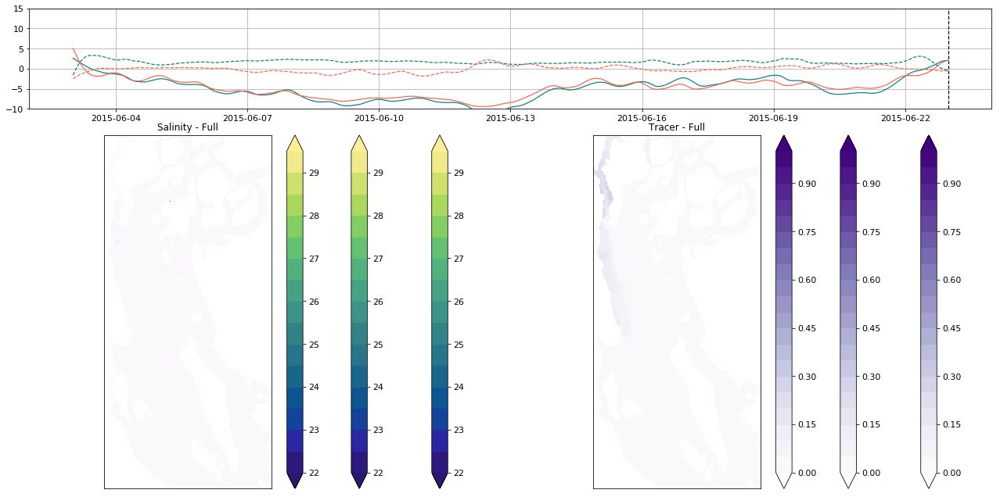

In [13]:
make_video(nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/03jun15/SalishSea_1h_20150603_20150622_grid_T.nc'),
nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/03jun15/SalishSea_1h_20150603_20150622_ptrc_T.nc'),
          'quadra_full.mp4')

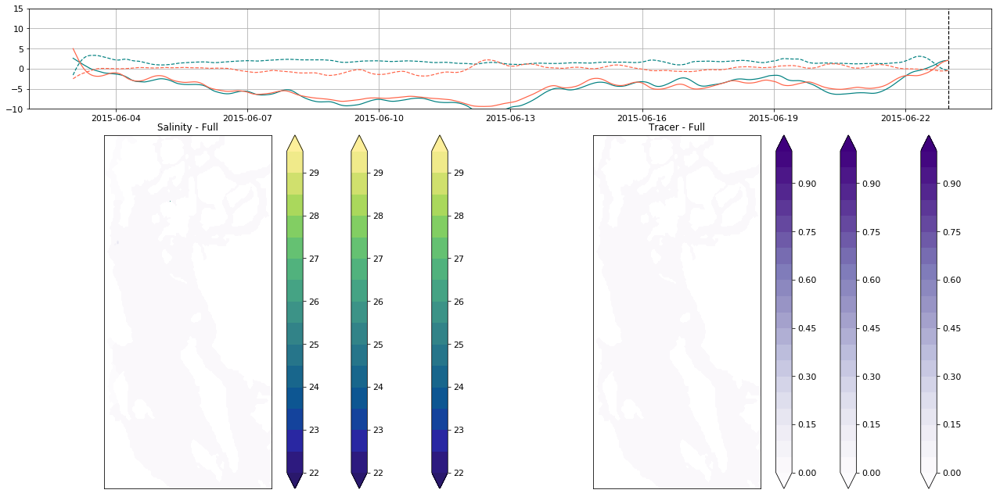

In [8]:
make_video(nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/03jun15lake/SalishSea_1h_20150603_20150622_grid_T.nc'),
nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/03jun15lake/SalishSea_1h_20150603_20150622_ptrc_T.nc'),
          'quadra_lake.mp4')

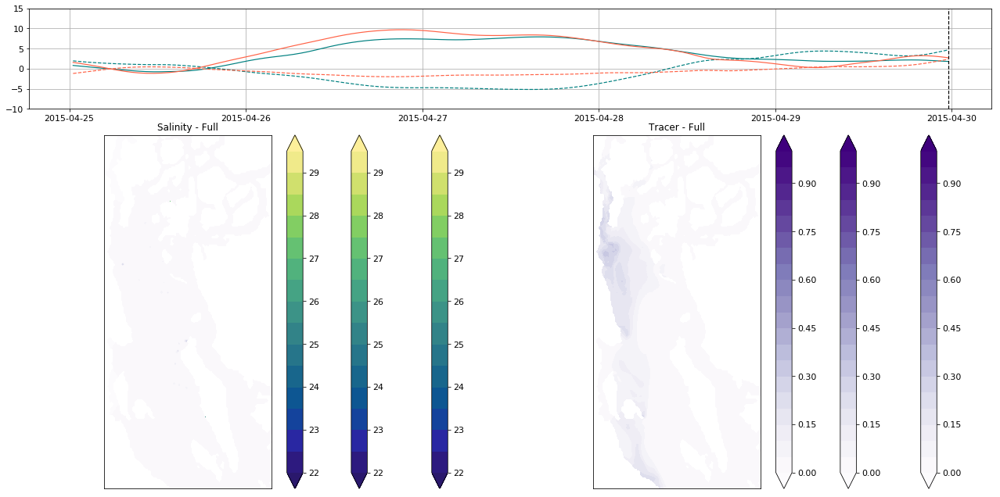

In [9]:
make_video(nc.Dataset(
'/data/vdo/MEOPAR/completed-runs/stats-runs2/25apr15/SalishSea_1h_20150425_20150429_grid_T.nc'),
          nc.Dataset(
'/data/vdo/MEOPAR/completed-runs/stats-runs2/25apr15/SalishSea_1h_20150425_20150429_ptrc_T.nc'),
          'bs_full.mp4')

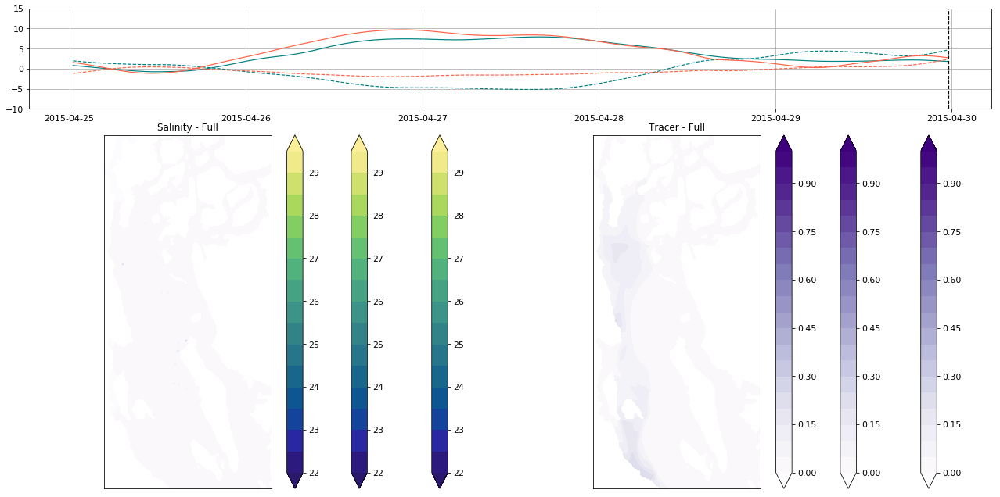

In [10]:
make_video(nc.Dataset(
'/data/vdo/MEOPAR/completed-runs/stats-runs2/25apr15lake/SalishSea_1h_20150425_20150429_grid_T.nc'),
          nc.Dataset(
'/data/vdo/MEOPAR/completed-runs/stats-runs2/25apr15lake/SalishSea_1h_20150425_20150429_ptrc_T.nc'),
          'bs_lake.mp4')

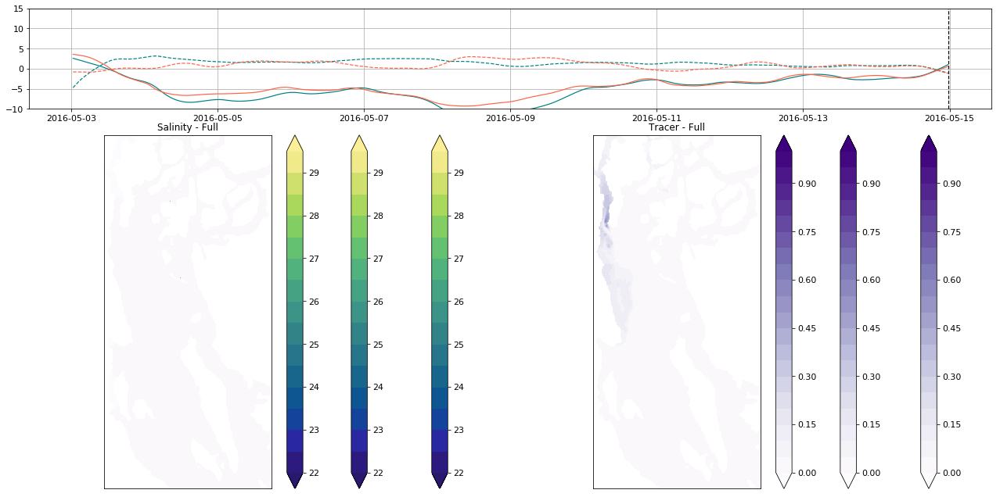

In [11]:
make_video(nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/03may16/SalishSea_1h_20160503_20160514_grid_T.nc'),
nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/03may16/SalishSea_1h_20160503_20160514_ptrc_T.nc'),
          'ds_full.mp4')

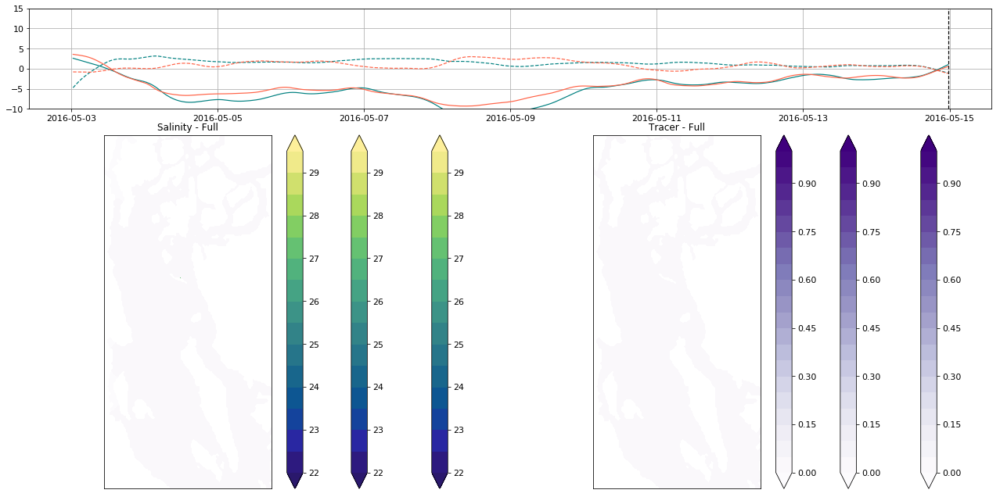

In [12]:
make_video(nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/03may16lake/SalishSea_1h_20160503_20160514_grid_T.nc'),
nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/03may16lake/SalishSea_1h_20160503_20160514_ptrc_T.nc'),
          'ds_lake.mp4')

In [14]:
bathy = nc.Dataset('/data/vdo/MEOPAR/grid/bathymetry_201702.nc')

In [20]:
def make_figure(trc_full, start, peak, end):
    fig, ax = plt.subplots(figsize = (18,9))
    gs = gridspec.GridSpec(4, 3)
    ax1 = plt.subplot(gs[0, :])
    ax2 = plt.subplot(gs[1:4, 0])
    ax3 = plt.subplot(gs[1:4, 1])
    ax4 = plt.subplot(gs[1:4, 2])
    plt.tight_layout()
    first = nc.num2date(trc_full.variables['time_counter'][0], 
                        trc_full.variables['time_counter'].units)
    end_index = trc_full.variables['time_counter'][:].shape[0]
    times = np.array([first + datetime.timedelta(hours = i) for i in range(end_index)])
    averaged_SI_u_winds = np.array([])
    averaged_SI_v_winds = np.array([])
    averaged_SS_u_winds = np.array([])
    averaged_SS_v_winds = np.array([])
    for n in range(end_index):
        SI_u_winds = winds_data.u_wind.isel(gridY=slice(159,162), 
                                            gridX=slice(119,122)).sel(time=times[n], 
                                                                      method = 'nearest').values
        averaged_SI_u_winds = np.append(averaged_SI_u_winds, np.mean(SI_u_winds))
        SI_v_winds = winds_data.v_wind.isel(gridY=slice(159,162), 
                                            gridX=slice(119,122)).sel(time=times[n], 
                                                                      method = 'nearest').values
        averaged_SI_v_winds = np.append(averaged_SI_v_winds, np.mean(SI_v_winds))
        SS_u_winds = winds_data.u_wind.isel(gridY=slice(182,185), 
                                            gridX=slice(106,109)).sel(time=times[n], 
                                                                      method = 'nearest').values
        averaged_SS_u_winds = np.append(averaged_SS_u_winds, np.mean(SS_u_winds))
        SS_v_winds = winds_data.v_wind.isel(gridY=slice(182,185), 
                                            gridX=slice(106,109)).sel(time=times[n], 
                                                                      method = 'nearest').values
        averaged_SS_v_winds = np.append(averaged_SS_v_winds, np.mean(SS_v_winds))
    rotated_SI_u_winds, rotated_SI_v_winds = viz_tools.rotate_vel(averaged_SI_u_winds, 
                                                                  averaged_SI_v_winds, 
                                                                  origin = 'map' )
    rotated_SS_u_winds, rotated_SS_v_winds = viz_tools.rotate_vel(averaged_SS_u_winds, 
                                                                  averaged_SS_v_winds, 
                                                                  origin = 'map' )
    SIwindfu = signal.filtfilt(B,A, rotated_SI_u_winds)
    SIwindfv = signal.filtfilt(B,A, rotated_SI_v_winds)
    SSwindfu = signal.filtfilt(B,A, rotated_SS_u_winds)
    SSwindfv = signal.filtfilt(B,A, rotated_SS_v_winds)
    ax1.set_title('Averaged and Filtered Winds')
    depths = trc_full.variables['deptht'][:]
    if 'mytracer' in trc_full.variables.keys():
        tracer = 'mytracer'
    else:
        tracer = 'mytracer3'
    #date = times[i]
    for ax in [ax1, ax2, ax3]:
        ax.clear()
    cmap = plt.get_cmap('Purples')
    ax1.plot(times, SIwindfu, '--', color = 'teal', label = 'si u winds')
    ax1.plot(times, SIwindfv, '-', color = 'teal', label = 'si v winds')
    ax1.plot(times, SSwindfu, '--', color = 'tomato', label = 'ss u winds')
    ax1.plot(times, SSwindfv, '-', color = 'tomato', label = 'ss v winds')
    ax1.plot((times[0], times[-1]), (0,0), ':', color = 'black')
    ax1.plot((times[start], times[start]), (-10,15), color = 'red')
    ax1.plot((times[peak], times[peak]), (-10,15), color = 'red')
    ax1.plot((times[end], times[end]), (-10,15), color = 'red')
    ax1.set_xlim(times[0], times[-1])
    ax1.legend()
    ax1.set_ylim(-10,15)
    #ax1.plot((date, date), (-10,15), 'b--', color = 'black')
    ax2.contourf(grid.variables['nav_lon'][:], 
                 grid.variables['nav_lat'][:], np.ma.masked_array(trc_full.variables[tracer][start,0,:], 
                                      mask = 1 - mesh_mask.variables['tmask'][0, 0, :]),
                   cmap = cmap, levels = np.arange(0,1.05,0.05), extend = 'both')
    ax2.set_title(times[start])
    ax3.contourf(grid.variables['nav_lon'][:], 
                 grid.variables['nav_lat'][:], np.ma.masked_array(trc_full.variables[tracer][peak,0,:], 
                                      mask = 1 - mesh_mask.variables['tmask'][0, 0, :]),
                   cmap = cmap, levels = np.arange(0,1.05,0.05), extend = 'both')
    ax3.set_title(times[peak])
    c = ax4.contourf(grid.variables['nav_lon'][:], 
                 grid.variables['nav_lat'][:], np.ma.masked_array(trc_full.variables[tracer][end,0,:], 
                                      mask = 1 - mesh_mask.variables['tmask'][0, 0, :]),
                   cmap = cmap, levels = np.arange(0,1.05,0.05), extend = 'both')
    ax4.set_title(times[end])
    for a in [ax2, ax3, ax4]:
        viz_tools.set_aspect(a, coords = 'map', lats = grid.variables['nav_lat'][:])
        a.contourf(grid.variables['nav_lon'][:], 
                 grid.variables['nav_lat'][:], mesh_mask.variables['tmask'][0,0,...],
                   levels=[-0.01, 0.01], colors='wheat')
        a.contour(grid.variables['nav_lon'][:], 
                 grid.variables['nav_lat'][:], mesh_mask.variables['tmask'][0,0,...], 
                  levels=[-0.01, 0.01], colors='k')
        a.set_ylim(49.4, 50.25)
        a.set_yticks([49.5, 50])
        a.set_xticks([-125, -124])
        a.set_xlim(-125.25, -123.6)
    for ax in [ax3, ax4]:
        ax.tick_params(labelleft = False)
    ax2.set_ylabel('Latitude')
    ax3.set_xlabel('Longitude')
    cax = fig.add_axes([0.2, 0.07, 0.6, 0.04])
    fig.colorbar(c, cax=cax, orientation='horizontal', label='Passive tracer concentration')

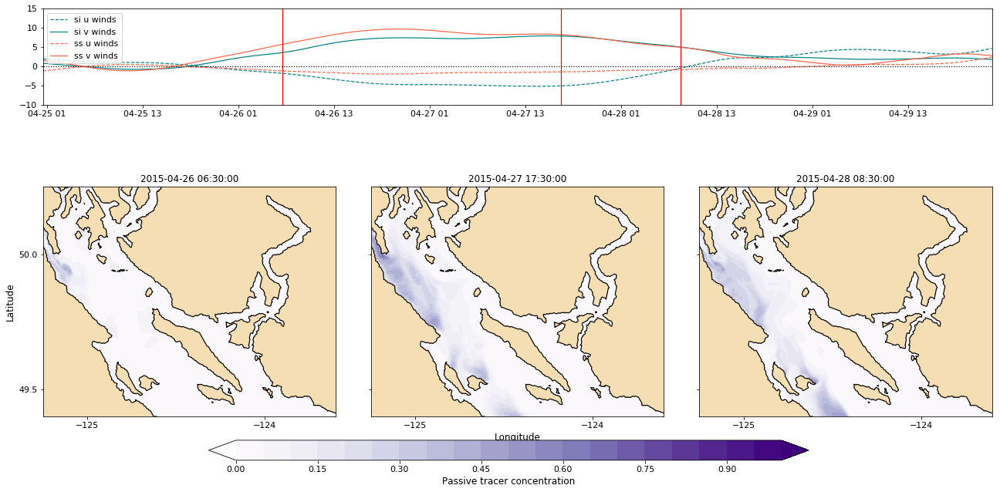

In [25]:
make_figure(nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/25apr15/SalishSea_1h_20150425_20150429_ptrc_T.nc'),
           30, 65, 80)

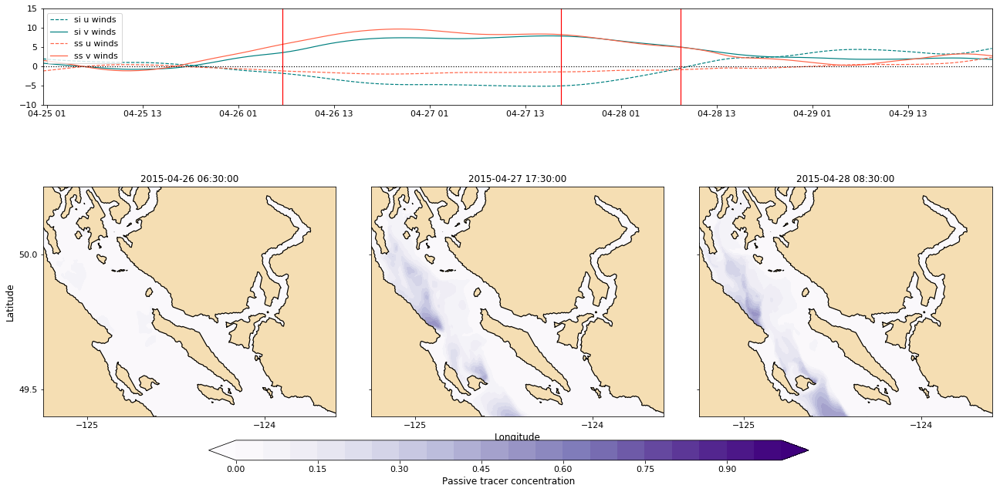

In [22]:
make_figure(nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/25apr15lake/SalishSea_1h_20150425_20150429_ptrc_T.nc'),
           30, 65, 80)

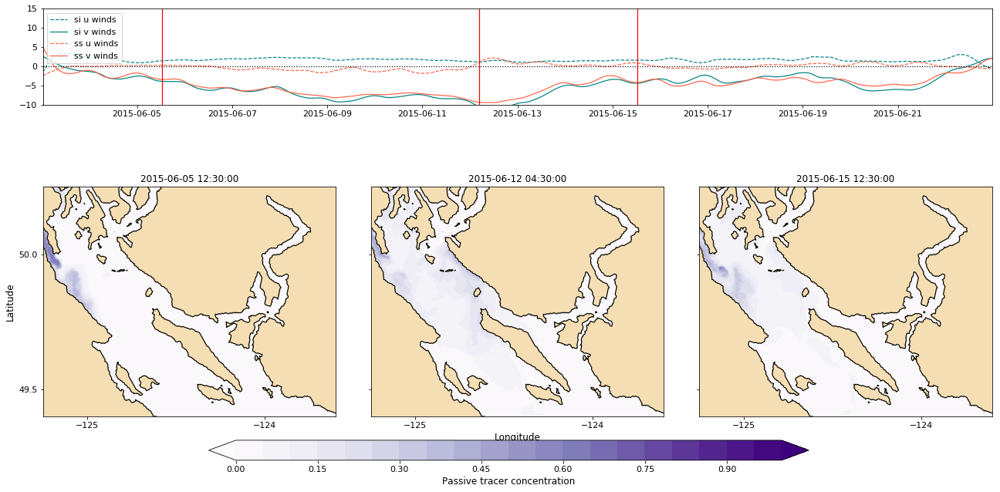

In [23]:
make_figure(nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/03jun15/SalishSea_1h_20150603_20150622_ptrc_T.nc'),
           60, 220, 300)

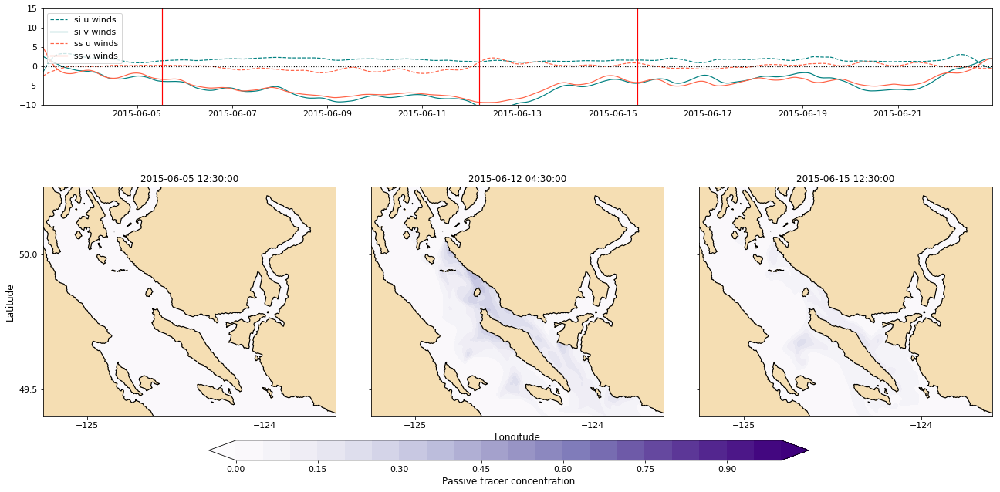

In [24]:
make_figure(nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/03jun15lake/SalishSea_1h_20150603_20150622_ptrc_T.nc'),
           60, 220, 300)

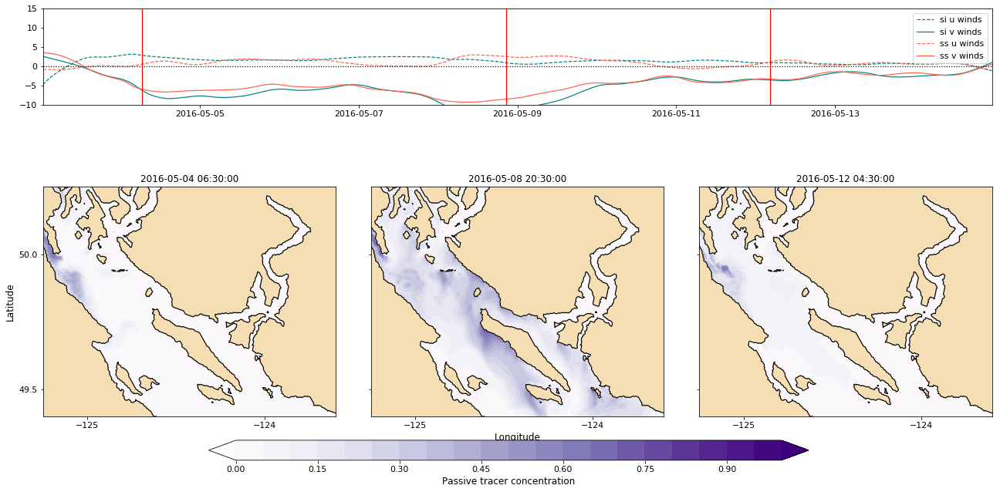

In [29]:
make_figure(nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/03may16/SalishSea_1h_20160503_20160514_ptrc_T.nc'),
           30, 140, 220)

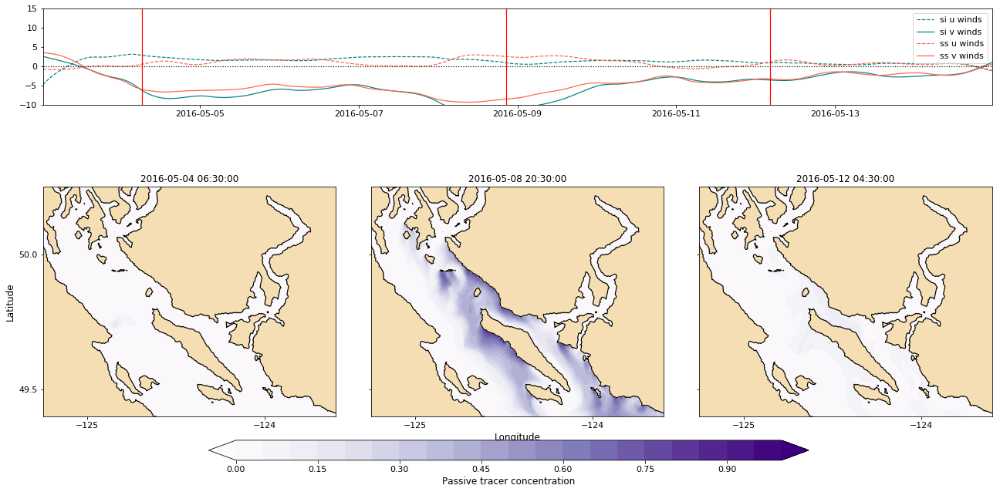

In [30]:
make_figure(nc.Dataset(
    '/data/vdo/MEOPAR/completed-runs/stats-runs2/03may16lake/SalishSea_1h_20160503_20160514_ptrc_T.nc'),
           30, 140, 220)

In [31]:
f0 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/21sep14/SalishSea_1h_20140921_20140927_ptrc_T.nc')
f1 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/15oct14/SalishSea_1h_20141015_20141025_ptrc_T.nc')
f2 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/27nov14/SalishSea_1h_20141127_20141204_ptrc_T.nc')
f3 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/03dec14/SalishSea_1h_20141203_20141211_ptrc_T.nc')
f4 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/23dec14/SalishSea_1h_20141223_20141230_ptrc_T.nc')
f5 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/16apr15/SalishSea_1h_20150416_20150423_ptrc_T.nc')
f6 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/25apr15/SalishSea_1h_20150425_20150429_ptrc_T.nc')
f7 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/30apr15/SalishSea_1h_20150430_20150503_ptrc_T.nc')
f8 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/03jun15/SalishSea_1h_20150603_20150622_ptrc_T.nc')
f9 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/29jun15/SalishSea_1h_20150629_20150706_ptrc_T.nc')
f10 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/13jul15/SalishSea_1h_20150713_20150722_ptrc_T.nc')
f11 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/09aug15/SalishSea_1h_20150809_20150824_ptrc_T.nc')
f12 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/27aug15/SalishSea_1h_20150827_20150903_ptrc_T.nc')
f13 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/10sep15/SalishSea_1h_20150910_20151013_ptrc_T.nc')
f14 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/13nov15/SalishSea_1h_20151113_20151125_ptrc_T.nc')
f15 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/12dec15/SalishSea_1h_20151212_20151215_ptrc_T.nc')
f16 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/23dec15/SalishSea_1h_20151223_20151226_ptrc_T.nc')
f17 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/10jan16/SalishSea_1h_20160110_20160206_ptrc_T.nc')
f18 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/26mar16/SalishSea_1h_20160326_20160329_ptrc_T.nc')
f19 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/03may16/SalishSea_1h_20160503_20160514_ptrc_T.nc')
f20 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/17may16/SalishSea_1h_20160517_20160520_ptrc_T.nc')
f21 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/24jul16/SalishSea_1h_20160724_20160802_ptrc_T.nc')
f22 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/02aug16/SalishSea_1h_20160802_20160828_ptrc_T.nc')
f23 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/29dec16/SalishSea_1h_20161229_20170102_ptrc_T.nc')
f24 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/29jan17/SalishSea_1h_20170129_20170201_ptrc_T.nc')
f25 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/03apr17/SalishSea_1h_20170403_20170407_ptrc_T.nc')
f26 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/10jun17/SalishSea_1h_20170610_20170616_ptrc_T.nc')
f27 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/19jun17/SalishSea_1h_20170619_20170629_ptrc_T.nc')
f28 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/08jul17b/SalishSea_1h_20170708_20170711_ptrc_T.nc')
f29 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/23jul17/SalishSea_1h_20170723_20170728_ptrc_T.nc')
f30 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/12sep17/SalishSea_1h_20170912_20170916_ptrc_T.nc')
f31 = nc.Dataset('/data/vdo/MEOPAR/completed-runs/stats-runs2/17dec17/SalishSea_1h_20171217_20171221_ptrc_T.nc')

In [32]:
f0surface = f0.variables['mytracer3'][:,0,350:750,100:]
f1surface = f1.variables['mytracer3'][:,0,350:750,100:]
f2surface = f2.variables['mytracer3'][:,0,350:750,100:]
f3surface = f3.variables['mytracer3'][:,0,350:750,100:]

In [33]:
f4surface = f4.variables['mytracer3'][:,0,350:750,100:]
f5surface = f5.variables['mytracer3'][:,0,350:750,100:]
f6surface = f6.variables['mytracer3'][:,0,350:750,100:]
f7surface = f7.variables['mytracer3'][:,0,350:750,100:]

In [34]:
f8surface = f8.variables['mytracer3'][:,0,350:750,100:]
f9surface = f9.variables['mytracer3'][:,0,350:750,100:]
f10surface = f10.variables['mytracer3'][:,0,350:750,100:]

In [35]:
f11surface = f11.variables['mytracer3'][:,0,350:750,100:]
f12surface = f12.variables['mytracer3'][:,0,350:750,100:]
f13surface = f13.variables['mytracer3'][:,0,350:750,100:]
f14surface = f14.variables['mytracer3'][:,0,350:750,100:]

In [36]:
f15surface = f15.variables['mytracer3'][:,0,350:750,100:]
f16surface = f16.variables['mytracer3'][:,0,350:750,100:]
f17surface = f17.variables['mytracer3'][:,0,350:750,100:]

In [37]:
f18surface = f18.variables['mytracer3'][:,0,350:750,100:]
f19surface = f19.variables['mytracer3'][:,0,350:750,100:]
f20surface = f20.variables['mytracer3'][:,0,350:750,100:]
f21surface = f21.variables['mytracer3'][:,0,350:750,100:]

In [38]:
f22surface = f22.variables['mytracer3'][:,0,350:750,100:]
f23surface = f23.variables['mytracer3'][:,0,350:750,100:]
f24surface = f24.variables['mytracer3'][:,0,350:750,100:]
f25surface = f25.variables['mytracer3'][:,0,350:750,100:]

In [39]:
f26surface = f26.variables['mytracer3'][:,0,350:750,100:]
f27surface = f27.variables['mytracer3'][:,0,350:750,100:]
f28surface = f28.variables['mytracer3'][:,0,350:750,100:]
f29surface = f29.variables['mytracer3'][:,0,350:750,100:]
f30surface = f30.variables['mytracer3'][:,0,350:750,100:]

In [40]:
f31surface = f30.variables['mytracer3'][:,0,350:750,100:]

In [41]:
mesh = nc.Dataset('/data/vdo/MEOPAR/grid/mesh_mask201702.nc')

In [42]:
together = np.append(f0surface, f1surface, axis = 0)
for f in ([f2surface,f3surface,f4surface,f5surface,f6surface,f7surface,f8surface,f9surface, 
           f10surface, f11surface, f12surface, f13surface, f14surface, f15surface, f16surface,
           f17surface, f18surface, f19surface, f20surface, f21surface, f22surface, f23surface,
           f24surface, f25surface, f26surface, f27surface, f28surface, f29surface, f30surface, f31surface]):
    together = np.append(together, f, axis = 0)
together.shape

(7536, 400, 298)

In [43]:
mask = 1 - mesh.variables['tmask'][0,0,380:750:5,100::5]
mask[55:, :10] = 1

In [44]:
Z2 = np.ma.reshape(np.ma.masked_array(together[:,30::5,::5], 
                                      mask = mask*np.ones((7536,1,1))).compressed(), 
                   ((7536, -1)))

In [45]:
winds = xr.open_dataset('https://salishsea.eos.ubc.ca/erddap/griddap/ubcSSaSurfaceAtmosphereFieldsV1')

In [46]:
si_uwinds = np.array([])
si_vwinds = np.array([])
ss_uwinds = np.array([])
ss_vwinds = np.array([])
dates = np.array([])
for f in ([f0, f1, f2, f3,f4, f5, f6,f7, f8, f9, f10, f11, f12, f13, f14, 
           f15, f16, f17, f18, f19, f20, f21, f22, f23, f24, f25, f26, f27, 
           f28, f29, f30,f31]):
    dates = np.append(dates, nc.num2date(f.variables['time_counter'][:],
                                        f.variables['time_counter'].units))
    si_uwind = (winds.u_wind.isel(gridY = 160, gridX = 120)
                .sel(time = slice(nc.num2date(f.variables['time_counter'][0],
                                              f.variables['time_counter'].units),
                                  nc.num2date(f.variables['time_counter'][-1],
                                              f.variables['time_counter'].units) 
                                  + datetime.timedelta(hours = 1)))).values
    si_vwind = (winds.v_wind.isel(gridY = 160, gridX = 120)
                .sel(time = slice(nc.num2date(f.variables['time_counter'][0],
                                              f.variables['time_counter'].units),
                                  nc.num2date(f.variables['time_counter'][-1],
                                              f.variables['time_counter'].units) 
                                  + datetime.timedelta(hours = 1)))).values
    ss_uwind = (winds.u_wind.isel(gridY = 183, gridX = 107)
                .sel(time = slice(nc.num2date(f.variables['time_counter'][0],
                                              f.variables['time_counter'].units),
                                  nc.num2date(f.variables['time_counter'][-1],
                                              f.variables['time_counter'].units) 
                                  + datetime.timedelta(hours = 1)))).values
    ss_vwind = (winds.v_wind.isel(gridY = 183, gridX = 107)
                .sel(time = slice(nc.num2date(f.variables['time_counter'][0],
                                              f.variables['time_counter'].units),
                                  nc.num2date(f.variables['time_counter'][-1],
                                              f.variables['time_counter'].units) 
                                  + datetime.timedelta(hours = 1)))).values
    si_uwinds = np.append(si_uwinds, si_uwind)
    si_vwinds = np.append(si_vwinds, si_vwind)
    ss_uwinds = np.append(ss_uwinds, ss_uwind)
    ss_vwinds = np.append(ss_vwinds, ss_vwind)

In [47]:
grid = nc.Dataset('/data/vdo/MEOPAR/NEMO-forcing/grid/bathymetry_201702.nc')
bathy, X, Y = tidetools.get_bathy_data(grid)
lats = grid.variables['nav_lat'][380:750:5,100::5]
lons = grid.variables['nav_lon'][380:750:5,100::5]

compressed_lats0 = np.ma.masked_array(lats, mask = mask).compressed()
compressed_lons0 = np.ma.masked_array(lons, mask = mask).compressed()
Yinds = np.array([])
Xinds = np.array([])
for lon, lat in zip(compressed_lons0, compressed_lats0):
    Yind, Xind = geo_tools.find_closest_model_point(lon, lat, X[380:750:5,100::5],Y[380:750:5,100::5], 
                                                    land_mask = mask)
    Yinds = np.append(Yinds, Yind)
    Xinds = np.append(Xinds, Xind)

In [48]:
import statsmodels.api as sm
from matplotlib.colors import LogNorm

200 km R2:  0.2594294183304173


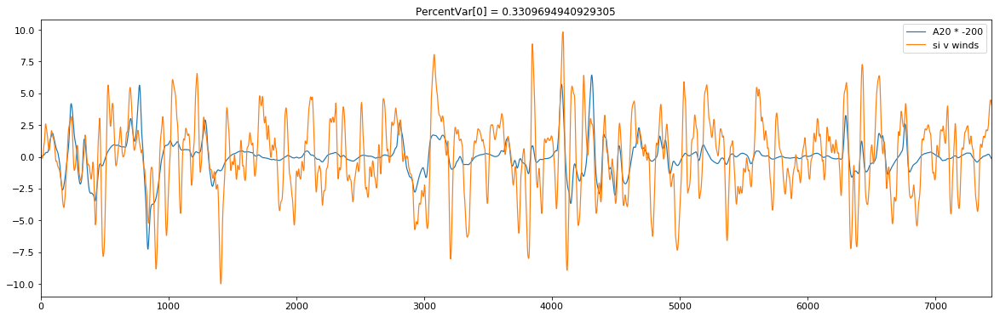

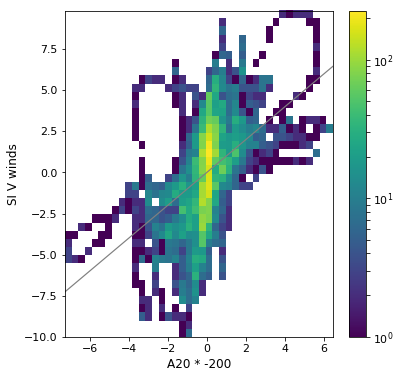

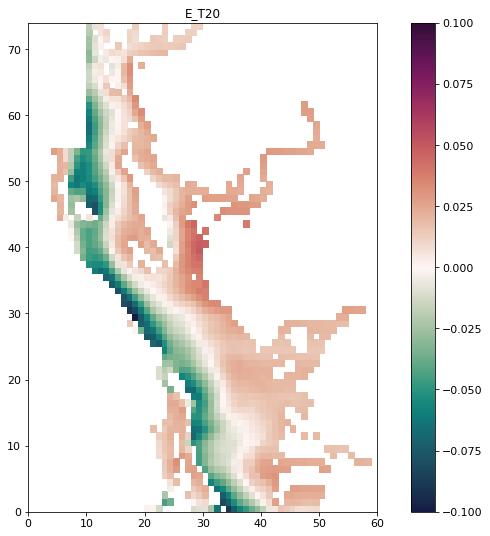

In [49]:
s = 20
s2 = 2
nyqst = 1 / 3600 / 2
lowcut = 1 / 86400 / s
highcut = 1 / 86400 / s2

together2 = np.zeros(Z2.shape)
for i, col in enumerate(Z2.T):
    together2[:,i] = signal.lfilter(*signal.butter(2, [lowcut / nyqst, highcut / nyqst], btype='bandpass'), col)
new_winds = signal.lfilter(*signal.butter(2, [lowcut / nyqst, highcut / nyqst], btype='bandpass'), si_vwinds)

s = 200000
nyqst = 1 / 500 / 2
lowcut = 1 / s
for i, row in enumerate(together2):  # -------------- Spatial trend
    together2[i, :] = signal.lfilter(*signal.butter(2, lowcut / nyqst, btype='highpass'), row)

A_prime2, sqrtL2, E_T2 = np.linalg.svd(together2, full_matrices=False)
A2 = A_prime2.dot(np.diag(sqrtL2))
PercentVar2 = sqrtL2**2/(sqrtL2**2).sum()
Z_02 = A2[:, 0, np.newaxis].dot(E_T2[0, np.newaxis, :])

fig, ax = plt.subplots(figsize = (20,6))
ax.plot(np.roll(A2[:,0], -19)*-2, label = 'A20 * -200')
ax.plot(new_winds, label = 'si v winds')
ax.legend()
ax.set_title('PercentVar[0] = ' + str(PercentVar2[0]))
ax.set_xlim(0,7440);

X = sm.add_constant(np.roll(A2[:,0], -19))
model = sm.OLS(new_winds, X)
results = model.fit()
print('200 km R2: ', results.rsquared)

fig, ax = plt.subplots(figsize = (6,6))
c, xedge, yedge, im = ax.hist2d(np.roll(A2[:,0], -19)*-2, new_winds, bins=40, norm=LogNorm())
ax.plot(np.arange(-20,20), np.arange(-20,20), color = 'grey')
ax.set_ylabel('SI V winds')
ax.set_xlabel('A20 * -200')
fig.colorbar(im, ax = ax);

gridded = np.zeros((74,60))
for Yind, Xind, data in zip(Yinds, Xinds, E_T2[0,:]):
    gridded[int(Yind), int(Xind)] = data
fig, ax = plt.subplots(figsize = ((12,9)))
z = ax.pcolormesh(np.ma.masked_array(gridded, 
                                     mask = mask),
                  vmin = -0.1, vmax = 0.1, 
                  cmap = cmocean.cm.curl)
fig.colorbar(z, ax=ax)
ax.set_title('E_T20')
viz_tools.set_aspect(ax);

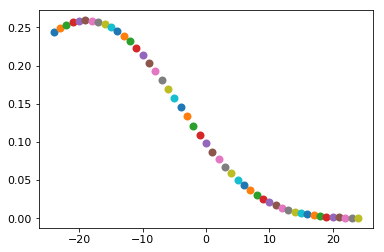

In [50]:
for n in np.arange(-24, 25, 1):
    X = sm.add_constant(np.roll(A2[:,0], n))
    model = sm.OLS(new_winds, X)
    results = model.fit()
    plt.plot(n, results.rsquared, 'o');